In [1]:
from aicsimageio import AICSImage
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import ttest_ind
import seaborn as sns
import os
import numpy as np
from statannotations.Annotator import Annotator
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import numpy as np


def load_image(path):
    img = AICSImage(path)
    return int_to_float(img.data[0][0][0])

def list_files_in_folder(folder_path):
    return os.listdir(folder_path)

def int_to_float(out):
    """
    Convert image data from integer to float format.

    Parameters:
    - out (np.ndarray): Input image data in integer format.

    Returns:
    - np.ndarray: Converted image data in float format.
    
    Note:
    If the input data type is 'uint16', the conversion is normalized to the range [0, 1]
    by dividing by ((2**16) - 1). If the input data type is 'uint8', the normalization
    is performed by dividing by ((2**8) - 1), resulting in the range [0, 1].
    """
    if out.dtype=='uint16':
        return out.astype(float)/((2**16)-1)
    elif out.dtype=='uint8':
        return out.astype(float)/((2**8)-1)
    
def get_closest_indices(df, value_col, group_col):
    """
    For each group in group_col, return the index of the row where the value in value_col
    is closest to the group's mean value.
    
    Parameters:
    - df: pandas DataFrame containing the data.
    - value_col: str, name of the column with numeric values.
    - group_col: str, name of the column to group by.
    
    Returns:
    - List of indices corresponding to the row closest to the group mean for each group.
    """
    indices = []
    for _, group in df.groupby(group_col):
        group_mean = group[value_col].median()
        # Compute the absolute differences from the mean
        diff = (group[value_col] - group_mean).abs()
        # Append the index of the row with the smallest difference
        indices.append(diff.idxmin())
    return indices

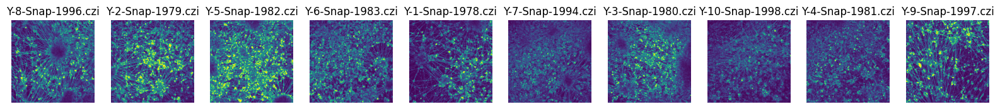

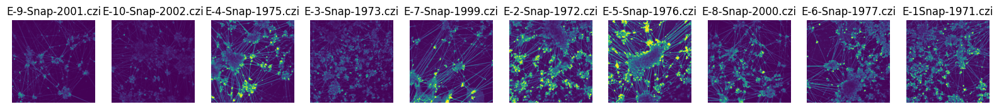

In [95]:
import matplotlib.pyplot as plt

# Load images from folder and show side by side
folder_path = '../../imaging_data/030625-Cellrox/'
files = np.array(list_files_in_folder(folder_path))[np.array(conditions)=='Y']
images = [load_image(f'{folder_path}/{file}') for file in files]

plt.figure(figsize=(20, 10))
for i, img in enumerate(images):
    plt.subplot(1, len(images), i + 1)
    plt.imshow(img, cmap='viridis', vmax=1)
    plt.title(files[i])
    plt.axis('off')
plt.show()

# Load images from folder and show side by side
folder_path = '../../imaging_data/030625-Cellrox/'
files = np.array(list_files_in_folder(folder_path))[np.array(conditions)=='E']
images = [load_image(f'{folder_path}/{file}') for file in files]

plt.figure(figsize=(20, 10))
for i, img in enumerate(images):
    plt.subplot(1, len(images), i + 1)
    plt.imshow(img, cmap='viridis', vmax=1)
    plt.title(files[i])
    plt.axis('off')
plt.show()

/var/folders/y7/zpj5hbtd2bl78b1t9h2723hw0000gn/T/ipykernel_52711/2613766848.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 4))


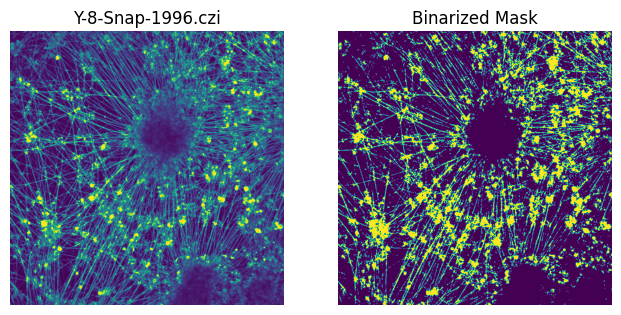

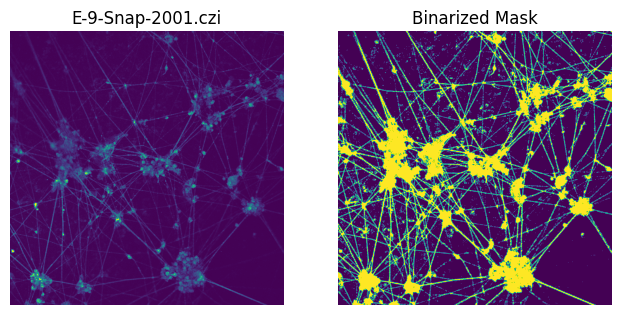

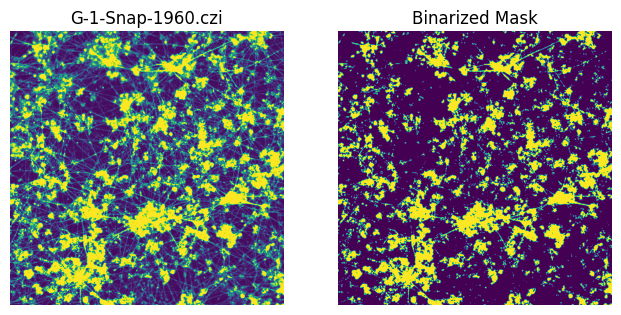

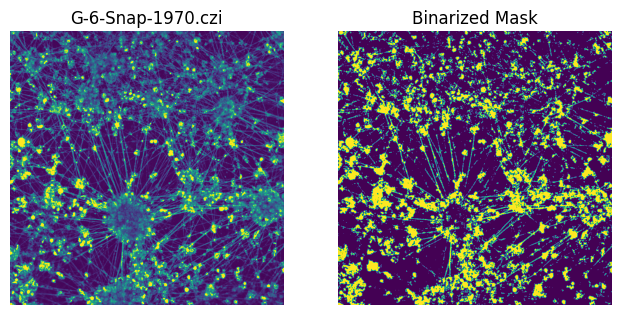

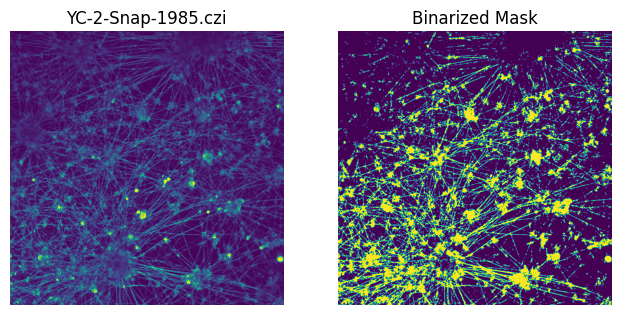

...

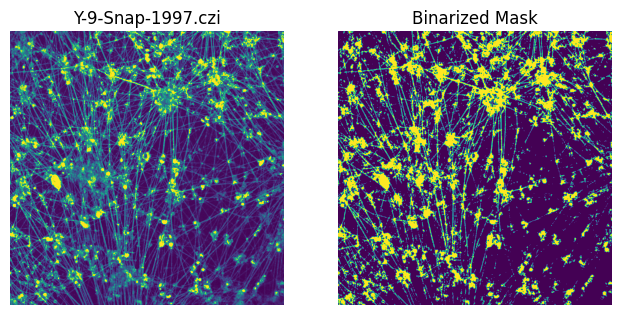

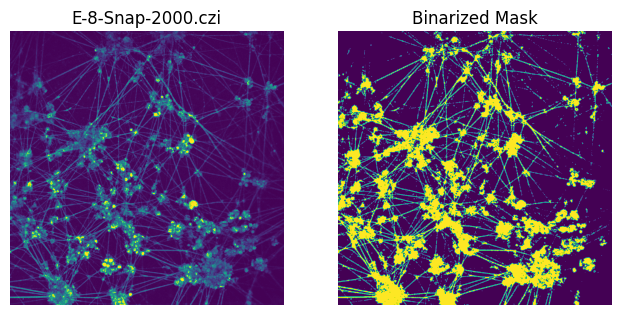

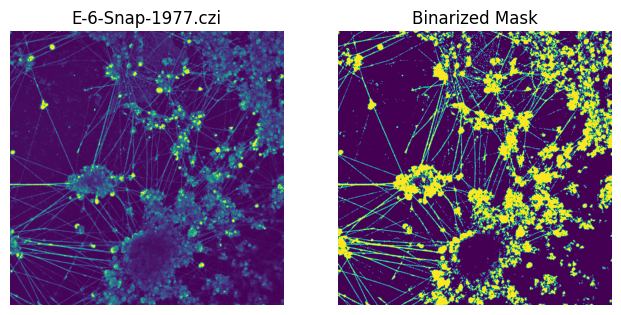

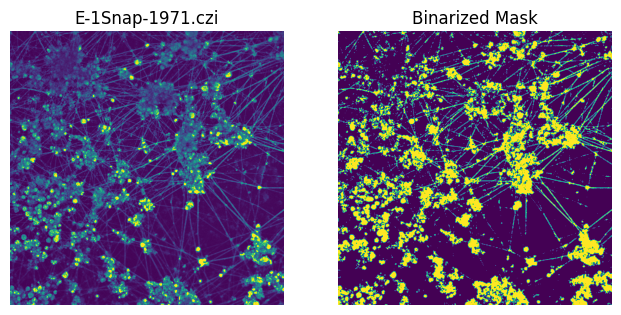

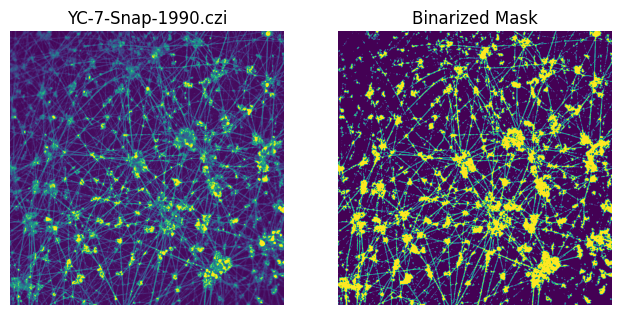

In [2]:
files = list_files_in_folder('../../imaging_data/030625-Cellrox')
values = []
conditions = []
wells = []
for i in files:
    x = load_image(f'../../imaging_data/030625-Cellrox/{i}')
    binarized_mask = x.copy()
    binarized_mask[binarized_mask>np.percentile(binarized_mask, 75)] = 1
    binarized_mask[binarized_mask!=1] = 0
    values.append(np.mean(x[binarized_mask==1]))
    conditions.append(i.split('-')[0].upper())
    wells.append(i.split('-')[1])

    plt.figure(figsize=(12, 4))
    # Show combined image after alignment
    plt.subplot(1, 3, 2)
    plt.imshow(x, vmax=1)
    plt.title(i)
    plt.axis('off')  # Remove axes labels, ticks, and numbers

    # Show binarized mask
    plt.subplot(1, 3, 3)
    plt.imshow(binarized_mask)
    plt.title('Binarized Mask')
    plt.axis('off')  # Remove axes labels, ticks, and numbers


In [5]:
# Create a DataFrame from the values, conditions, and wells lists
data = {
    'Value': values,
    'Condition': conditions,
    'Well': wells
}
df = pd.DataFrame(data)

In [6]:
files = list_files_in_folder('../../imaging_data/030625-Cellrox')

np.array(files)[get_closest_indices(df, 'Value', 'Condition')]

array(['E-7-Snap-1999.czi', 'G-6-Snap-1970.czi', 'Y-8-Snap-1996.czi',
       'YC-1-Snap-1984.czi'], dtype='<U19')

In [7]:

def plot_boxplot_by_treatment(d, x_val, y_val, order, pairs, palette):
    # Draw the boxplot with a semi-transparent fill (alpha=0.5) applied via boxprops.
    ax = sns.boxplot(
        data=d, 
        x=x_val, 
        y=y_val, 
        palette=palette, 
        order=order, 
        width=0.5, 
       # capsize=0.1, 
        linewidth=1,

        showfliers=False
    )
    # Overlay the stripplot
    sp = sns.stripplot(
        data=d, 
        x=x_val, 
        y=y_val, 
        dodge=False, 
        jitter=0.1, 
        alpha=1,  
        order=order, 
        color='black',
        #palette=palette,
        size=3
    )

    #plt.ylim(0, plt.ylim()[1])
    # Shift the stripplot points slightly to the left.
    shift = 0.4  # Adjust this value as needed
    for i, coll in enumerate(sp.collections):
        # if i == 0:
        #     shift = 0.4
        # elif i == 1:
        #     shift = 0.4
        # elif i == 2:
        #     shift = 0.4
            
        offsets = coll.get_offsets()
        # Subtract from the x-coordinate to move left
        offsets[:, 0] = offsets[:, 0] + shift
        coll.set_offsets(offsets)
    # Add statistical annotations
    annotator = Annotator(ax, pairs, data=d, x=x_val, y=y_val, order=order)
    annotator.configure(test='t-test_ind', text_format='full', loc='outside',
                        verbose=2, show_test_name=False, line_offset_to_group=10,  # Increases space between the brackets and the plot
    text_offset=5)
    annotator.apply_and_annotate()

    plt.xticks(rotation=0)
    plt.xlabel('')

    # Adjust the boxes so that the face remains semi-transparent while the edge is opaque.
    # Try iterating over both ax.artists and ax.patches.
    for patch in ax.patches:
        # Get the current facecolor (an RGBA tuple)
        fc = patch.get_facecolor()
        # Set the facecolor to have your desired alpha (e.g., 0.5)
        patch.set_facecolor((fc[0], fc[1], fc[2], 0.5))
        # Set the edgecolor to the same RGB but fully opaque (alpha=1)
        #patch.set_edgecolor((fc[0], fc[1], fc[2], 1.0))
        patch.set_linewidth(1)

    return ax


In [8]:
df.head()
df_sub = df[(df['Condition']=='E') | (df['Condition']=='Y')]

E vs. Y: t-test independent samples, P_val:2.155e-02 t=-2.517e+00


/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


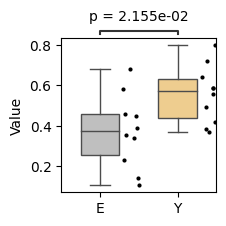

In [31]:

plt.figure(figsize=(2, 2))

ax1 = plot_boxplot_by_treatment(df_sub, 'Condition', 'Value', order = ['E', 'Y'], pairs = [('E', 'Y')],palette={'E': 'grey', 'Y': 'orange'} )


#plt.savefig('../../paper/main_plots/tmrm_choline_boxplot.png', dpi=300, bbox_inches='tight')


In [9]:

def compute_distance_from_group_mean(df, value_col, group_col):
    """
    Computes how far each row's value is from the mean of its group.
    
    Parameters:
      df (pd.DataFrame): DataFrame containing the data.
      value_col (str): Column name for the numeric values.
      group_col (str): Column name for the group labels.
    
    Returns:
      pd.Series: A series containing the absolute distance from the group mean for each row.
    """
    # Compute the mean for each group and assign it to every row in that group
    group_mean = df.groupby(group_col)[value_col].transform('mean')
    
    # Calculate the absolute difference between the value and the group's mean
    distance = (df[value_col] - group_mean).abs()
    return distance

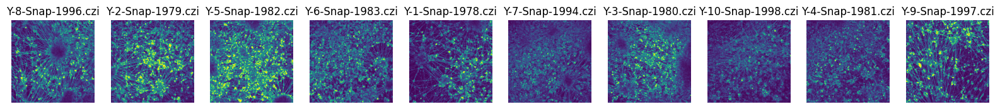

In [8]:
# Load images from folder and show side by side
folder_path = '../../imaging_data/030625-Cellrox/'
files = np.array(list_files_in_folder(folder_path))[np.array(conditions)=='Y']
images = [load_image(f'{folder_path}/{file}') for file in files]

plt.figure(figsize=(20, 10))
for i, img in enumerate(images):
    plt.subplot(1, len(images), i + 1)
    plt.imshow(img, cmap='viridis', vmax=1)
    plt.title(files[i])
    plt.axis('off')
plt.show()

In [103]:
np.array(files)[get_closest_indices(df, 'Value', 'Condition')]

array(['E-7-Snap-1999.czi', 'G-6-Snap-1970.czi', 'Y-8-Snap-1996.czi',
       'YC-1-Snap-1984.czi'], dtype='<U19')

In [77]:
x = pd.DataFrame(np.vstack((np.array(files), np.array(compute_distance_from_group_mean(df, 'Value', 'Condition'))))).T
x.sort_values(by=0)


,0,1
7,E-10-Snap-2002.czi,0.2670112570609542
38,E-1Snap-1971.czi,0.07482236529133346
28,E-2-Snap-1972.czi,0.20849258310328977
9,E-3-Snap-1973.czi,0.144362664735408
8,E-4-Snap-1975.czi,0.08793415385663983
30,E-5-Snap-1976.czi,0.30658256134896
37,E-6-Snap-1977.czi,0.017880419664906166
10,E-7-Snap-1999.czi,0.017044355109178455
36,E-8-Snap-2000.czi,0.03433444206167707
1,E-9-Snap-2001.czi,0.23128723518645616


In [10]:
df['files'] = files

In [16]:
# plot separately (without FCCP) for main figure

def file_closest_to_median(df, condition_col="condition", target_col="value", file_col="files"):
    """
    For each group (specified by condition_col), this function computes the mean of target_col
    and returns a dictionary mapping each group to the file name (from file_col)
    that has a target_col value closest to that group's mean.
    """
    result = {}
    # Group by the condition column.
    for cond, group in df.groupby(condition_col):
        # Calculate the mean of the target column for this condition.
        mean_val = group[target_col].median()
        # Compute absolute differences from the mean.
        group = group.copy()  # Avoid SettingWithCopyWarning
        group["abs_diff"] = (group[target_col] - mean_val).abs()
        # Find the row index with the minimal difference.
        idx = group["abs_diff"].idxmin()
        # Get the corresponding file name.
        result[cond] = group.loc[idx, file_col]
    return result


In [37]:
file_closest_to_median(df, condition_col='Condition', target_col='Value', file_col='files')

{'E': 'E-7-Snap-1999.czi',
 'G': 'G-6-Snap-1970.czi',
 'Y': 'Y-8-Snap-1996.czi',
 'YC': 'YC-1-Snap-1984.czi'}

In [38]:
0.643350/0.58

1.1092241379310346

In [39]:
0.461032/0.390142

1.1817030722147321

In [35]:
df.sort_values(by='files')

,Value,Condition,Well,files
7,0.106087,E,10,E-10-Snap-2002.czi
38,0.447921,E,1Snap,E-1Snap-1971.czi
28,0.581591,E,2,E-2-Snap-1972.czi
9,0.228735,E,3,E-3-Snap-1973.czi
8,0.461032,E,4,E-4-Snap-1975.czi
30,0.679681,E,5,E-5-Snap-1976.czi
37,0.355218,E,6,E-6-Snap-1977.czi
10,0.390142,E,7,E-7-Snap-1999.czi
36,0.338764,E,8,E-8-Snap-2000.czi
1,0.141811,E,9,E-9-Snap-2001.czi


/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


E vs. Y: t-test independent samples, P_val:2.155e-02 t=-2.517e+00


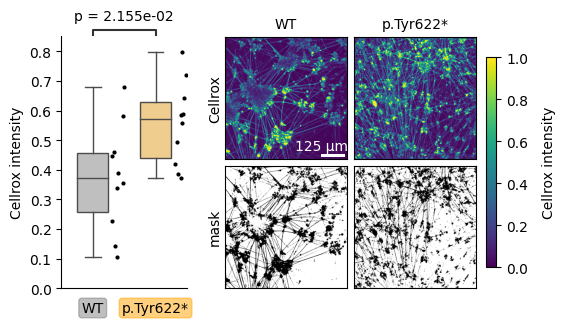

In [45]:
cmap = 'viridis'
# Assuming your data and helper functions (e.g., load_image, plot_boxplot_by_treatment) are already defined
df_sub = df[(df['Condition']=='E') | (df['Condition']=='Y')]

# Create a new figure with a gridspec with 1 row and 2 columns.
fig = plt.figure(figsize=(5, 3))
gs = fig.add_gridspec(1, 2, width_ratios=[0.6, 1.2])  # adjust ratios as needed

# ------------------
# Left: Boxplot panel
# ------------------
ax_box = fig.add_subplot(gs[0])
# (Option 1) If your function does not accept an ax parameter, you can set the current axes:
plt.sca(ax_box)
ax_box = plot_boxplot_by_treatment(df_sub, 'Condition', 'Value', order = ['E', 'Y'], pairs = [('E', 'Y')],palette={'E': 'grey', 'Y': 'orange'})

ax_box.set_ylabel('Cellrox intensity', fontsize=10)
ax_box.set_xticks([])

# Optionally add your custom x-axis labels to ax_box
ax_box.text(0, -0.05, "WT", ha='center', va='top', 
            transform=ax_box.get_xaxis_transform(),
            bbox=dict(boxstyle="round,pad=0.2", fc="grey", ec="grey", alpha=0.5), 
            fontsize=10)
ax_box.text(1, -0.05, "p.Tyr622*", ha='center', va='top', 
            transform=ax_box.get_xaxis_transform(),
            bbox=dict(boxstyle="round,pad=0.2", fc="orange", ec="orange", alpha=0.5), 
            fontsize=10)

ax_box.spines['top'].set_visible(False)
ax_box.spines['right'].set_visible(False)
ax_box.set_ylim(0, 0.85)

# ------------------
# Right: Image panel with 2x2 subplots
# ------------------
# Create a nested gridspec for the right panel (2 rows x 2 columns)
gs_right = gs[1].subgridspec(2, 2, wspace=0.05, hspace=0.05)

# Top left image
ax_img1 = fig.add_subplot(gs_right[0, 0])
img1 = load_image('../../imaging_data/030625-Cellrox/E-4-Snap-1975.czi')
# Process image if needed (e.g., create a binarized mask)
binarized_mask_e1 = img1.copy()
binarized_mask_e1[img1 > np.percentile(img1, 75)] = 1
binarized_mask_e1[img1 <= np.percentile(img1, 75)] = 0

ax_img1.imshow(img1, vmin=0, vmax=1, cmap=cmap)
ax_img1.set_title('WT', fontsize=10)
ax_img1.set_xticks([])
ax_img1.set_yticks([])

# Top right image
ax_img2 = fig.add_subplot(gs_right[0, 1])
img2 = load_image('../../imaging_data/030625-Cellrox/Y-9-Snap-1997.czi')
ax_img2.imshow(img2, vmin=0, vmax=1, cmap=cmap)
ax_img2.set_title('p.Tyr622*', fontsize=10)
ax_img2.set_xticks([])
ax_img2.set_yticks([])

# Process image if needed (e.g., create a binarized mask)
binarized_mask_y9 = img2.copy()
binarized_mask_y9[img2 > np.percentile(img2, 75)] = 1
binarized_mask_y9[img2 <= np.percentile(img2, 75)] = 0

# Bottom left image
ax_img3 = fig.add_subplot(gs_right[1, 0])
ax_img3.imshow(binarized_mask_e1, cmap='gray_r')
ax_img3.set_xticks([])
ax_img3.set_yticks([])

# Bottom left image
ax_img4 = fig.add_subplot(gs_right[1, 1])
ax_img4.imshow(binarized_mask_y9, cmap='gray_r')
ax_img4.set_xticks([])
ax_img4.set_yticks([])

ax_img1.set_ylabel('Cellrox', rotation=90, fontsize=10, labelpad=2)
ax_img3.set_ylabel('mask', rotation=90, fontsize=10, labelpad=2)

# Optionally add a colorbar to the right of the image panel
norm = plt.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label(r'Cellrox intensity', labelpad=10)

# ------------------
# Final adjustments and save
# ------------------
#fig.suptitle('ABCA7 p.Tyr622*', fontsize=10, y=1.)  # Title spanning both panels

# # Add single bar and title spanning both columns
# fig.text(0.65, 1.03, 'ABCA7 p.Tyr622*', horizontalalignment='center', fontsize=10)

# # Add vertical bar above spanning both columns
# bar_width = 5
# bar_y = 1
# fig.add_artist(plt.Line2D([0.41, 0.89], [bar_y, bar_y], color='black', transform=fig.transFigure))


# plt.subplots_adjust(left=0.07, right=0.9, top=0.92, bottom=0.08)
# add scale bar 
import matplotlib.patches as patches

# Assume the image dimensions in out_fppc[0] (height, width)
img_height, img_width = binarized_mask_y9.shape
bar_length = 200    # scale bar length in pixels (adjust as needed)
bar_height = 20     # thickness of the scale bar in pixels

# Position the scale bar in the lower right corner with some margin
margin = 20
x_start = img_width - bar_length - margin
y_start = img_height - margin

# Create a white rectangle for the scale bar
scale_bar = patches.Rectangle((x_start, y_start - bar_height), bar_length, bar_height, 
                               linewidth=0, edgecolor=None, facecolor='white')
ax_img1.add_patch(scale_bar)

img = AICSImage('../../imaging_data/030625-Cellrox/Y-9-Snap-1997.czi')
# Add a text label above the scale bar (centered)
ax_img1.text(x_start, y_start-150, f'{bar_length * img.physical_pixel_sizes[1]:.0f} μm', 
                color='white', ha='center', va='top', fontsize=10)

#plt.savefig('../../paper/main_plots/tmrm_choline.png', dpi=300, bbox_inches='tight')
plt.subplots_adjust(left=0.07, right=0.9, top=0.92, bottom=0.08)
plt.savefig('../../paper/main_plots/cellrox_images.png', dpi=300, bbox_inches='tight')
plt.show()


/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


Y vs. YC: t-test independent samples, P_val:1.068e-02 t=2.848e+00


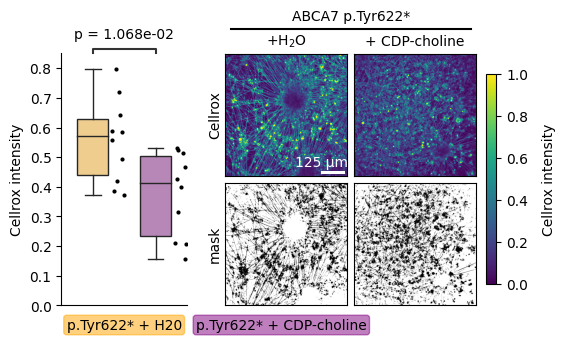

In [44]:
df_sub = df[(df['Condition']=='YC') | (df['Condition']=='Y')]

cmap = 'viridis'

# Assuming your data and helper functions (e.g., load_image, plot_boxplot_by_treatment) are already defined

# Create a new figure with a gridspec with 1 row and 2 columns.
fig = plt.figure(figsize=(5, 3))
gs = fig.add_gridspec(1, 2, width_ratios=[0.6, 1.2])  # adjust ratios as needed

# ------------------
# Left: Boxplot panel
# ------------------
ax_box = fig.add_subplot(gs[0])
# (Option 1) If your function does not accept an ax parameter, you can set the current axes:
plt.sca(ax_box)
ax_box = plot_boxplot_by_treatment(df_sub, 'Condition', 'Value', order = ['Y', 'YC'], pairs = [('Y', 'YC')],palette={'Y': 'orange', 'YC': 'purple'})

ax_box.set_ylabel('Cellrox intensity', fontsize=10)
ax_box.set_xticks([])

# Optionally add your custom x-axis labels to ax_box
ax_box.text(0.5, -0.05, "p.Tyr622* + H20", ha='center', va='top', 
            transform=ax_box.get_xaxis_transform(),
            bbox=dict(boxstyle="round,pad=0.2", fc="orange", ec="orange", alpha=0.5), 
            fontsize=10)
ax_box.text(3, -0.05, "p.Tyr622* + CDP-choline", ha='center', va='top', 
            transform=ax_box.get_xaxis_transform(),
            bbox=dict(boxstyle="round,pad=0.2", fc="purple", ec="purple", alpha=0.5), 
            fontsize=10)

ax_box.spines['top'].set_visible(False)
ax_box.spines['right'].set_visible(False)
ax_box.set_ylim(0, 0.85)

# ------------------
# Right: Image panel with 2x2 subplots
# ------------------
# Create a nested gridspec for the right panel (2 rows x 2 columns)
gs_right = gs[1].subgridspec(2, 2, wspace=0.05, hspace=0.05)

# Top left image
ax_img1 = fig.add_subplot(gs_right[0, 0])
img1 = load_image('../../imaging_data/030625-Cellrox/Y-8-Snap-1996.czi')
# Process image if needed (e.g., create a binarized mask)
binarized_mask_e1 = img1.copy()
binarized_mask_e1[img1 > np.percentile(img1, 75)] = 1
binarized_mask_e1[img1 <= np.percentile(img1, 75)] = 0

ax_img1.imshow(img1, vmin=0, vmax=1, cmap=cmap)
ax_img1.set_title('+H$_2$O', fontsize=10)
ax_img1.set_xticks([])
ax_img1.set_yticks([])

# Top right image
ax_img2 = fig.add_subplot(gs_right[0, 1])
img2 = load_image('../../imaging_data/030625-Cellrox/YC-1-Snap-1984.czi')
ax_img2.imshow(img2, vmin=0, vmax=1, cmap=cmap)
ax_img2.set_title('+ CDP-choline', fontsize=10)
ax_img2.set_xticks([])
ax_img2.set_yticks([])

# Process image if needed (e.g., create a binarized mask)
binarized_mask_y9 = img2.copy()
binarized_mask_y9[img2 > np.percentile(img2, 75)] = 1
binarized_mask_y9[img2 <= np.percentile(img2, 75)] = 0

# Bottom left image
ax_img3 = fig.add_subplot(gs_right[1, 0])
ax_img3.imshow(binarized_mask_e1, cmap='gray_r')
ax_img3.set_xticks([])
ax_img3.set_yticks([])

# Bottom left image
ax_img4 = fig.add_subplot(gs_right[1, 1])
ax_img4.imshow(binarized_mask_y9, cmap='gray_r')
ax_img4.set_xticks([])
ax_img4.set_yticks([])

ax_img1.set_ylabel('Cellrox', rotation=90, fontsize=10, labelpad=2)
ax_img3.set_ylabel('mask', rotation=90, fontsize=10, labelpad=2)

# Optionally add a colorbar to the right of the image panel
norm = plt.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label(r'Cellrox intensity', labelpad=10)

# ------------------
# Final adjustments and save
# ------------------
#fig.suptitle('ABCA7 p.Tyr622*', fontsize=10, y=1.)  # Title spanning both panels

# # Add single bar and title spanning both columns
# fig.text(0.65, 1.03, 'ABCA7 p.Tyr622*', horizontalalignment='center', fontsize=10)

# # Add vertical bar above spanning both columns
# bar_width = 5
# bar_y = 1
# fig.add_artist(plt.Line2D([0.41, 0.89], [bar_y, bar_y], color='black', transform=fig.transFigure))

# Add single bar and title spanning both columns
fig.text(0.65, 1.03, 'ABCA7 p.Tyr622*', horizontalalignment='center', fontsize=10)

# Add vertical bar above spanning both columns
bar_width = 5
bar_y = 1
fig.add_artist(plt.Line2D([0.41, 0.89], [bar_y, bar_y], color='black', transform=fig.transFigure))

import matplotlib.patches as patches

# Assume the image dimensions in out_fppc[0] (height, width)
img_height, img_width = binarized_mask_y9.shape
bar_length = 200    # scale bar length in pixels (adjust as needed)
bar_height = 20     # thickness of the scale bar in pixels

# Position the scale bar in the lower right corner with some margin
margin = 20
x_start = img_width - bar_length - margin
y_start = img_height - margin

# Create a white rectangle for the scale bar
scale_bar = patches.Rectangle((x_start, y_start - bar_height), bar_length, bar_height, 
                               linewidth=0, edgecolor=None, facecolor='white')
ax_img1.add_patch(scale_bar)

img = AICSImage('../../imaging_data/030625-Cellrox/Y-9-Snap-1997.czi')
# Add a text label above the scale bar (centered)
ax_img1.text(x_start, y_start-150, f'{bar_length * img.physical_pixel_sizes[1]:.0f} μm', 
                color='white', ha='center', va='top', fontsize=10)

# plt.subplots_adjust(left=0.07, right=0.9, top=0.92, bottom=0.08)

#plt.savefig('../../paper/main_plots/tmrm_choline.png', dpi=300, bbox_inches='tight')
plt.subplots_adjust(left=0.07, right=0.9, top=0.92, bottom=0.08)
plt.savefig('../../paper/main_plots/cellrox_images_choline.png', dpi=300, bbox_inches='tight')
plt.show()


In [65]:


# Assuming there are two conditions to compare, e.g., 'CONDITION1' and 'CONDITION2'
condition1_values = df[df['Condition'] == 'E']['Value']
condition2_values = df[df['Condition'] == 'G']['Value']

# Perform t-test
t_stat, p_value = ttest_ind(condition1_values, condition2_values, equal_var=False)

print(f"T-statistic: {t_stat}, P-value: {p_value}")


T-statistic: -1.8169736752365402, P-value: 0.08855902062993003


In [68]:
from scipy.stats import ttest_ind

# Assuming there are two conditions to compare, e.g., 'CONDITION1' and 'CONDITION2'
condition1_values = df[df['Condition'] == 'E']['Value']
condition2_values = df[df['Condition'] == 'Y']['Value']

# Perform t-test
t_stat, p_value = ttest_ind(condition1_values, condition2_values, equal_var=False)

print(f"T-statistic: {t_stat}, P-value: {p_value}")


T-statistic: -2.5165084444125205, P-value: 0.022205077520696465


<Axes: xlabel='Condition', ylabel='Value'>

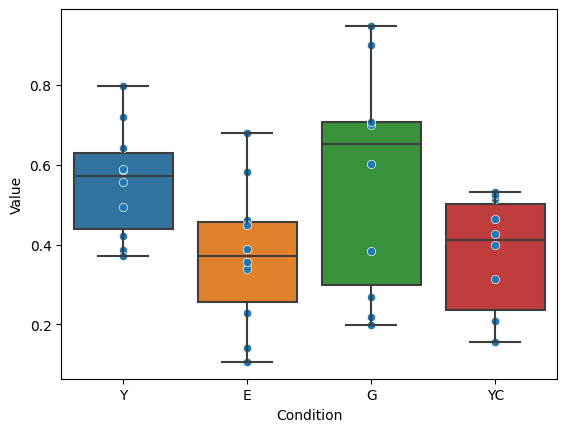

In [32]:
import seaborn as sns
sns.boxplot(x='Condition', y='Value', data=df)
sns.scatterplot(x='Condition', y='Value', data=df)

In [69]:
from statannotations.Annotator import Annotator

plt.figure(figsize=(3, 2))
#df_temp = df_temp[df_temp['condition']!='E3']

ax1 = plot_boxplot_by_treatment(df, 'Condition', 'Value', order = ['E','G', 'Y', 'YC'], pairs = [('E', 'G'), ('E', 'Y'), ('Y', 'YC')],palette={'E': 'grey', 'G': 'orange', 'Y': 'purple', 'YC': 'green'} )


NameError: name 'plot_boxplot_by_treatment' is not defined

<Figure size 300x200 with 0 Axes>

In [47]:

def plot_boxplot_by_treatment(d, x_val, y_val, order, pairs, palette):
    # Draw the boxplot with a semi-transparent fill (alpha=0.5) applied via boxprops.
    ax = sns.boxplot(
        data=d, 
        x=x_val, 
        y=y_val, 
        palette=palette, 
        order=order, 
        width=0.5, 
       # capsize=0.1, 
        linewidth=1,

        showfliers=False
    )
    # Overlay the stripplot
    sp = sns.stripplot(
        data=d, 
        x=x_val, 
        y=y_val, 
        dodge=False, 
        jitter=0.1, 
        alpha=1,  
        order=order, 
        color='black',
        #palette=palette,
        size=3
    )

    #plt.ylim(0, plt.ylim()[1])
    # Shift the stripplot points slightly to the left.
    shift = 0.4  # Adjust this value as needed
    for i, coll in enumerate(sp.collections):
        # if i == 0:
        #     shift = 0.4
        # elif i == 1:
        #     shift = 0.4
        # elif i == 2:
        #     shift = 0.4
            
        offsets = coll.get_offsets()
        # Subtract from the x-coordinate to move left
        offsets[:, 0] = offsets[:, 0] + shift
        coll.set_offsets(offsets)
    # Add statistical annotations
    annotator = Annotator(ax, pairs, data=d, x=x_val, y=y_val, order=order)
    annotator.configure(test='t-test_ind', text_format='full', loc='outside',
                        verbose=2, show_test_name=False, line_offset_to_group=10,  # Increases space between the brackets and the plot
    text_offset=5)
    annotator.apply_and_annotate()

    plt.xticks(rotation=0)
    plt.xlabel('')

    # Adjust the boxes so that the face remains semi-transparent while the edge is opaque.
    # Try iterating over both ax.artists and ax.patches.
    for patch in ax.patches:
        # Get the current facecolor (an RGBA tuple)
        fc = patch.get_facecolor()
        # Set the facecolor to have your desired alpha (e.g., 0.5)
        patch.set_facecolor((fc[0], fc[1], fc[2], 0.5))
        # Set the edgecolor to the same RGB but fully opaque (alpha=1)
        #patch.set_edgecolor((fc[0], fc[1], fc[2], 1.0))
        patch.set_linewidth(1)

    return ax
